In [1]:
#Import packages
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(20,18), 'figure.dpi':500})
from numpy import log
import warnings
import itertools
import numpy as np
plt.style.use('fivethirtyeight')
#Load dataset
data = pd.read_excel('Snowboard_Data.xlsx',
                       index_col ='Date',
                       parse_dates = True)
# Print the 1st 5 rows of the dataset
data.head()

,Quantity
Date,
2009-01-01,168.0
2009-02-01,177.0
2009-03-01,198.0
2009-04-01,193.5
2009-05-01,181.5


In [2]:
#We need to ensure the date is a date type and is indexed
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 2009-01-01 to 2020-12-01
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Quantity  144 non-null    float64
dtypes: float64(1)
memory usage: 2.2 KB


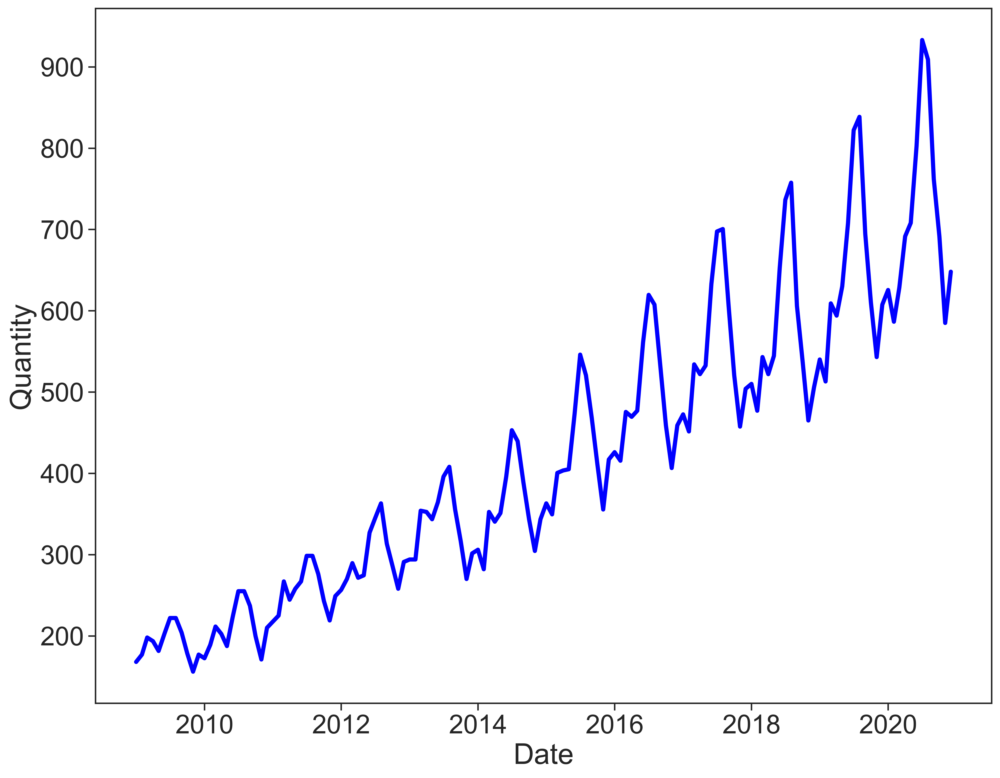

In [3]:
#Plot data
#import matplotlib.pyplot as plt
#import seaborn as sns
#import pandas as pd
sns.set(font_scale=2) 
plt.figure(figsize = (12,10))
#choose a grid style out of darkgrid, whitegrid, dark, white, ticks
sns.set_style("ticks", {"axes.facecolor": "white"})
sns.lineplot(x = "Date", y = "Quantity", data = data, color='blue', linewidth=3.5)
plt.show()

In [4]:
# ETS Decomposition --> our data is multiplicative
result = seasonal_decompose(data['Quantity'], 
                            model ='multiplicative')
  
# ETS plot
result.plot()

In [5]:
# Take the moving average of last 6 obs
rolling = data.rolling(window=6)
rolling_mean = rolling.mean()
 
# plot the two series
plt.plot(data)
plt.plot(rolling_mean, color='red')
plt.show()

<AxesSubplot:title={'center':'Forecasts from Exponential Smoothing'}, xlabel='Date', ylabel='Quantity Snowboards Sold'>

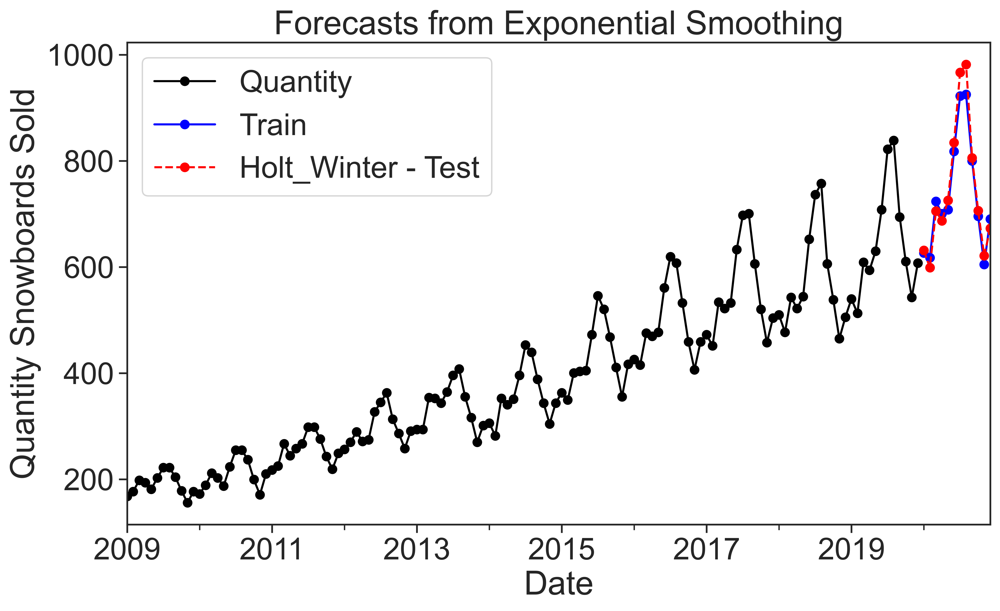

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import ExponentialSmoothing

# Split data into train / test sets
train = data.iloc[:len(data)-12]
test = data.iloc[len(data)-12:] 

# set one year(12 months) for testing
fit1 = ExponentialSmoothing(np.asarray(train['Quantity']) ,seasonal_periods=12 ,trend='multiplicative', seasonal='multiplicative',).fit()

# create class
# Apply the box-cox power transformation - this that takes the original (non-normally distributed) data as input and returns the fitted data (normally distributed)
# See Source: (GeekksforGeeks , 2021) - https://www.geeksforgeeks.org/box-cox-transformation-using-python/
EMA_fit = ExponentialSmoothing(train['Quantity'], seasonal_periods=12, trend='multiplicative', seasonal='multiplicative').fit(use_boxcox=True)

# fit model and make prediciton
fcast = EMA_fit.forecast(len(test))#or can be 12   
# if the series was monthly data and the seasonal period repeated each year, then the Period=12.

y_hat_avg = test.copy()
y_hat_avg['Holt_Winter'] = fit1.forecast(len(test))

#holt winter is ES and can be additive or multiplicative and we know we have multiplicative seasonality
ax = train.plot(figsize=(10,6), marker='o', color='black', title="Forecasts from Exponential Smoothing" )
ax.set_ylabel("Quantity Snowboards Sold")
ax.set_xlabel("Index")
EMA_fit.forecast(12).rename('Train').plot(ax=ax, marker='o', color='blue', legend=True)
y_hat_avg.Holt_Winter.rename('Holt_Winter - Test').plot(ax=ax, style='--', marker='o', color='red', legend=True)

In [7]:
forecast = fcast 
forecast = pd.DataFrame(forecast)
forecast
forecast_es = forecast.rename(columns={0: "ES_Forecast"})
forecast_es

,ES_Forecast
2020-01-01,626.573588
2020-02-01,617.508286
2020-03-01,723.847311
2020-04-01,700.605264
2020-05-01,708.291205
2020-06-01,818.134746
2020-07-01,922.284478
2020-08-01,925.466120
2020-09-01,800.186302
2020-10-01,695.686560


In [8]:
# Load specific evaluation tools
# We will now calculate RMSE to check to accuracy of our model.
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from math import sqrt
rms = sqrt(mean_squared_error( forecast_es.ES_Forecast, test.Quantity))
print(rms)
#The value we get is: 34.69362278646293

34.69362278646293


In [10]:
#Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
axes[0, 0].plot(data.Quantity); axes[0, 0].set_title('Original Series')
plot_acf(data.Quantity, ax=axes[0, 1]) #autocorrelation plot
#1st Differencing
axes[1, 0].plot(data.Quantity.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(data.Quantity.diff().dropna(), ax=axes[1, 1]) #autocorrelation plot
#2nd Differencing
axes[2, 0].plot(data.Quantity.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(data.Quantity.diff().diff().dropna(), ax=axes[2, 1]) #autocorrelation plot
plt.show()

In [12]:
# Import library
from pmdarima import auto_arima
  
# Supress warnings that are not important
import warnings
warnings.filterwarnings("ignore")
  
# Apply auto_arima to data
sw_fit = auto_arima(data['Quantity'], start_p = 1, start_q = 1,
                          max_p = 3, max_q = 3, m = 12,
                          start_P = 0, seasonal = True,
                          d = None, D = 1, trace = True,
                          error_action ='ignore',   
                          suppress_warnings = True,  
                          stepwise = True)#We are using the stepwise approach          
# Summarise the stepwise results
sw_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=1129.128, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=1137.740, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=1126.624, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=1127.234, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=1126.625, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=1125.471, Time=0.11 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=1126.724, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=1138.352, Time=0.08 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=1127.351, Time=0.17 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=1127.264, Time=0.26 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=1125.409, Time=0.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=1126.656, Time=0.07 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(1,1,1)[12]     

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  144
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 12)   Log Likelihood                -558.705
Date:                             Tue, 10 Aug 2021   AIC                           1125.409
Time:                                     14:57:00   BIC                           1136.910
Sample:                                          0   HQIC                          1130.083
                                             - 144                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3634      0.074     -4.945      0.000      -0.508      -0.219
ar.S.L12      -0.1239      0.090     -1.372      0.170      -0.301       0.053
ar.S.L24       0.1910      0.107      1.783      0.075      -0.019       0.401
sigma2       293.5085     34.935      8.402      0.000     225.037     361.980
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 4.59
Prob(Q):                              0.92   Prob(JB):                         0.10
Heteroskedasticity (H):               2.70   Skew:                             0.15
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [16]:
# Split data into train and test sets
train = data.iloc[:len(data)-12]
test = data.iloc[len(data)-12:] # set one year(12 months) for testing
  
# Fit a SARIMAX(0, 1, 1)x(2, 1, 1, 12) on the training set
from statsmodels.tsa.statespace.sarimax import SARIMAX
  
model = SARIMAX(train['Quantity'], 
                order = (0, 1, 1), 
                seasonal_order =(2, 1, 1, 12))
  
result = model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                           Quantity   No. Observations:                  132
Model:             SARIMAX(0, 1, 1)x(2, 1, 1, 12)   Log Likelihood                -491.264
Date:                            Tue, 10 Aug 2021   AIC                            992.528
Time:                                    14:59:23   BIC                           1006.423
Sample:                                01-01-2009   HQIC                           998.170
                                     - 12-01-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2984      0.076     -3.946      0.000      -0.447      -0.150
ar.S.L12       0.7095      0.229      3.105      0.002       0.262       1.157
ar.S.L24       0.2895      0.100      2.890      0.004       0.093       0.486
ma.S.L12      -0.9791      2.055     -0.476      0.634      -5.007       3.049
sigma2       198.7678    366.954      0.542      0.588    -520.450     917.985
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                 0.00
Prob(Q):                              0.85   Prob(JB):                         1.00
Heteroskedasticity (H):               1.62   Skew:                            -0.00
Prob(H) (two-sided):                  0.13   Kurtosis:                         2.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:xlabel='Date'>

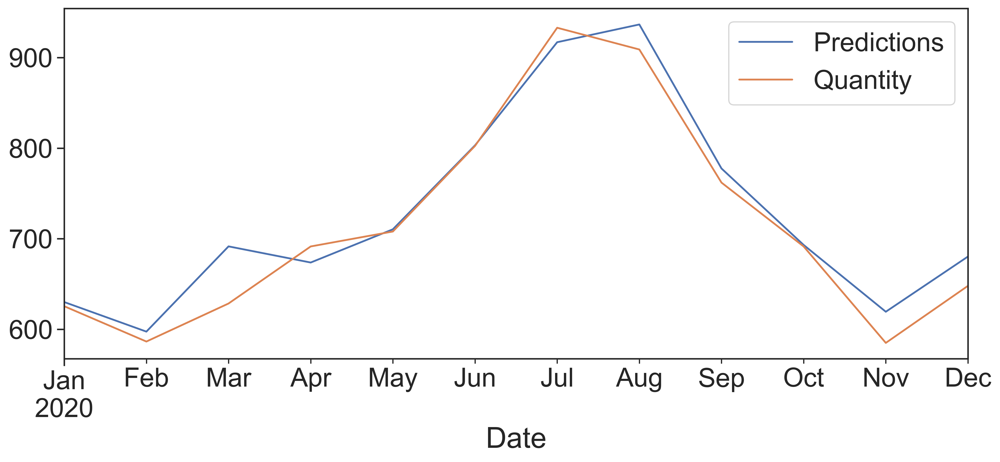

In [17]:
start = len(train)
end = len(train) + len(test) - 1
  
# Predictions for one-year against the test set
pred = result.predict(start, end,
                             typ = 'levels').rename("Predictions")
  
# plot predictions and actual values
pred.plot(figsize = (12, 5), legend = True)
Quantity =test['Quantity']
Quantity.plot(legend = True)

In [18]:
# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
  
# Calculate root mean squared error

#RMSE is always greater than 0, where 0 indicates that our model has a perfect fit(theoretically possible, but hardly achieved in practice)
rmse(test["Quantity"], pred)
#The value we get: 25.715869516322755
# this is a much lower RMSE as our previous model

25.715869516322755

<AxesSubplot:xlabel='Date'>

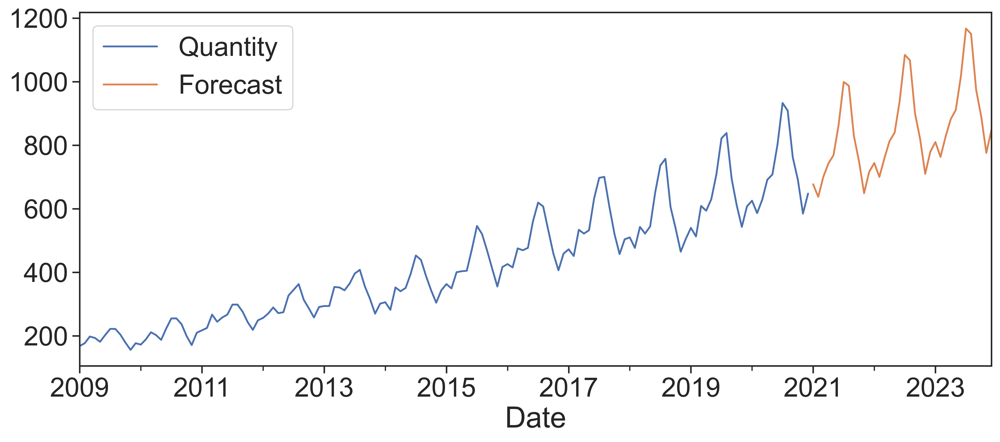

In [19]:
# Train the model on the full dataset
model = SARIMAX(data['Quantity'], 
                        order = (0, 1, 1), 
                        seasonal_order =(2, 1, 1, 12))
result = model.fit()
  
# Forecast for the next 2 years
fcast_sarima = result.predict(start = len(data), 
                          end = (len(data)-1) + 3 * 12, 
                          typ = 'levels').rename('Forecast')
  
# Plot the forecast values
data['Quantity'].plot(figsize = (12, 5), legend = True)
fcast_sarima.plot(legend = True)

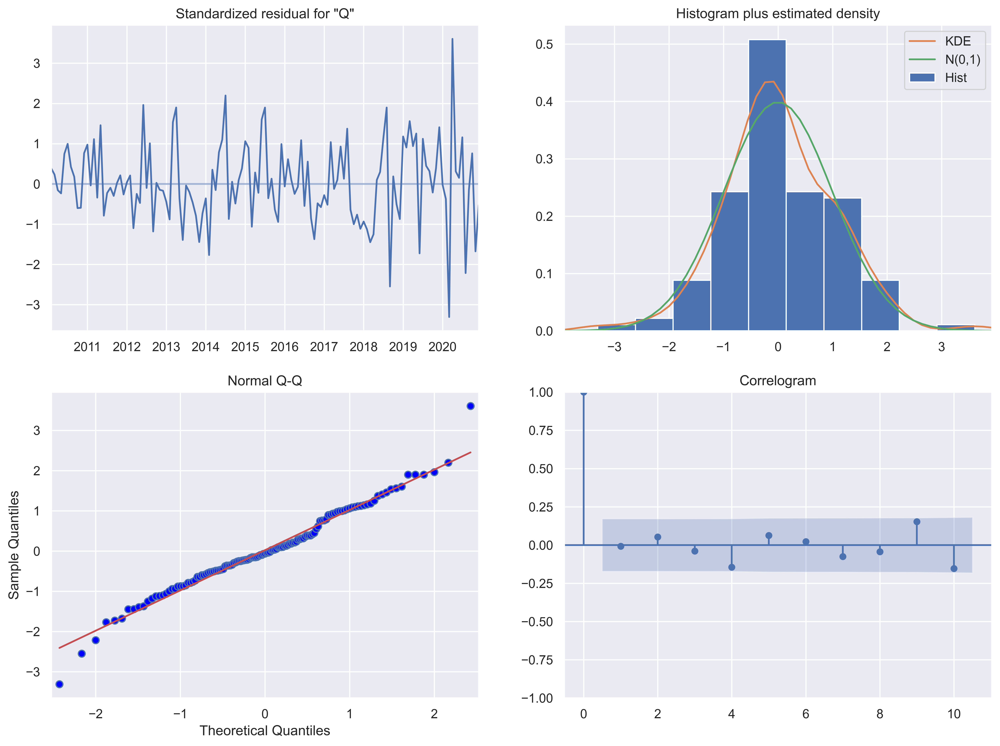

In [20]:
sns.set(font_scale=1) 
result.plot_diagnostics(figsize=(13 , 10))
plt.show()